# Projeto - Perceptron e MLP

## 

Para resolver o primeiro mini projeto, o aluno ou o grupo de alunos (grupo de no máximo 3 pessoas) devem escolher um `dataset` a escolha de vocês ou um dos `datasets` indicados no _Drive_ da turma para realizar o projeto. A partir do `dataset` escolhido, desenvolva os itens abaixo:

__A)__ (10 pontos) Desenvolva uma análise exploratória dos dados adequada;

__B)__ (5 pontos) Faça a preparação dos dados para treinar os modelos;

__C)__ (15 pontos) Teste pelo menos 3 modelos de _Machine Learning_ convencional, sendo algumas sugestões como Regressão Logística, Árvore de Decisão, _Random Forest_ entre outros;

__D)__ (30 pontos) Desenvolva uma rede neural _Perceptron_ para fazer a separação entre as classes. O modelo consegue fazer a separação linear dos dados? Avaliar utilizando o PCA caso necessário;

__E)__ (30 pontos) Monte duas redes neurais MLP utilizando combinações de camadas diferentes (teste algumas combinações para chegar em uma melhor performance dos resultados).

__F)__ (10 pontos) Qual dos modelos teve a melhor performance entre os modelos convencionais, _Perceptron_ e MLP? Discuta um pouco a respeito.

<br>

__Entrega:__ até o dia 30/09 pelo Class (vou criar uma atividade como projeto para que vocês entreguem por lá)

__Monitoria:__ dia 20/09 e 27/09;

#### Importação das bibliotecas que serão utilizadas no projeto

In [163]:
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, MinMaxScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, f1_score, confusion_matrix
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.decomposition import PCA
from mlxtend.plotting import plot_confusion_matrix

from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.over_sampling import SMOTE

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.svm import SVC
import warnings

warnings.simplefilter("ignore")

#### Leitura do arquivo csv

In [2]:
df = pd.read_csv("../Projeto/datasets/banco_train.csv", sep=";")
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [3]:
pd.options.display.max_rows = 400       # Aumentando o número de linhas visíveis
pd.options.display.max_columns = 400    # Aumentando o número de colunas visíveis

Verificando a existência ou não de dados nulos e os tipos de dado de cada coluna

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [5]:
df.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [6]:
df.describe(include="all")

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
count,45211.000000,45211,45211,45211,45211,45211.000000,45211,45211,45211,45211.000000,45211,45211.000000,45211.000000,45211.000000,45211.000000,45211,45211
unique,NaN,12,3,4,2,NaN,2,2,3,NaN,12,NaN,NaN,NaN,NaN,4,2
top,NaN,blue-collar,married,secondary,no,NaN,yes,no,cellular,NaN,may,NaN,NaN,NaN,NaN,unknown,no
freq,NaN,9732,27214,23202,44396,NaN,25130,37967,29285,NaN,13766,NaN,NaN,NaN,NaN,36959,39922
mean,40.936210,NaN,NaN,NaN,NaN,1362.272058,NaN,NaN,NaN,15.806419,NaN,258.163080,2.763841,40.197828,0.580323,NaN,NaN
std,10.618762,NaN,NaN,NaN,NaN,3044.765829,NaN,NaN,NaN,8.322476,NaN,257.527812,3.098021,100.128746,2.303441,NaN,NaN
min,18.000000,NaN,NaN,NaN,NaN,-8019.000000,NaN,NaN,NaN,1.000000,NaN,0.000000,1.000000,-1.000000,0.000000,NaN,NaN
25%,33.000000,NaN,NaN,NaN,NaN,72.000000,NaN,NaN,NaN,8.000000,NaN,103.000000,1.000000,-1.000000,0.000000,NaN,NaN
50%,39.000000,NaN,NaN,NaN,NaN,448.000000,NaN,NaN,NaN,16.000000,NaN,180.000000,2.000000,-1.000000,0.000000,NaN,NaN
75%,48.000000,NaN,NaN,NaN,NaN,1428.000000,NaN,NaN,NaN,21.000000,NaN,319.000000,3.000000,-1.000000,0.000000,NaN,NaN


#### Análise gráfica das colunas

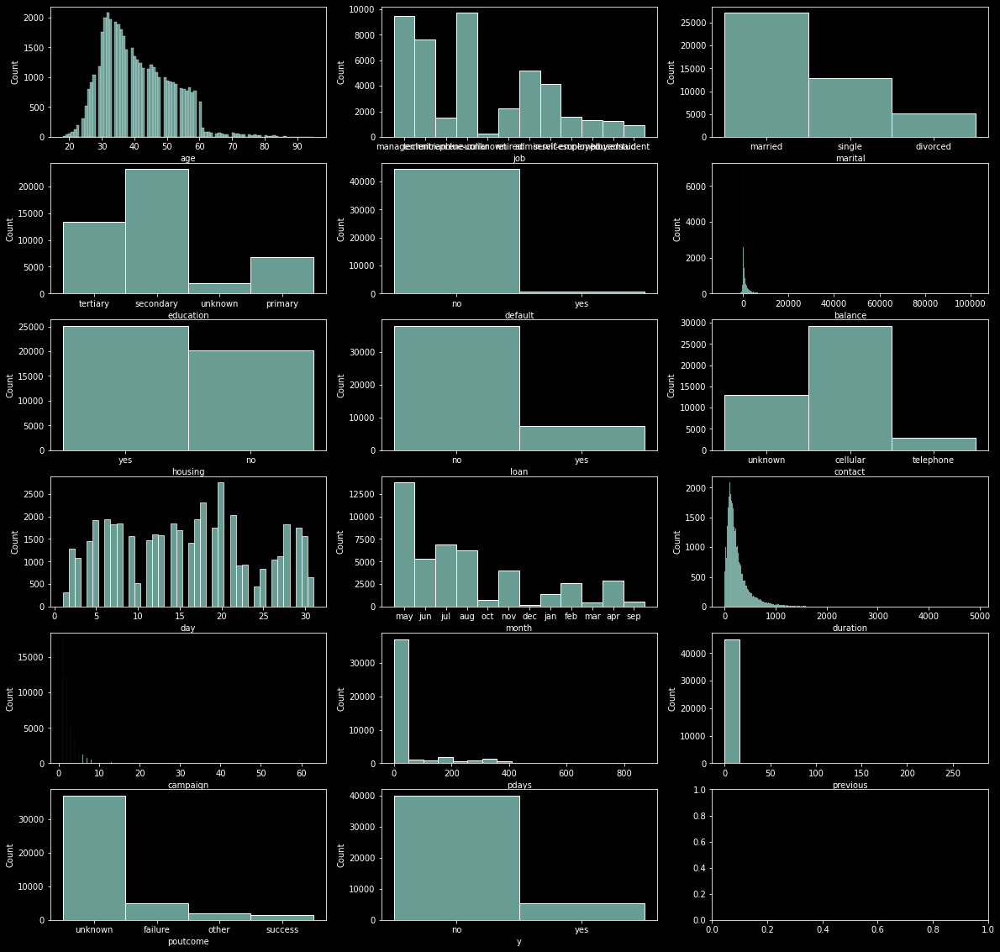

In [7]:
fig, ax = plt.subplots(6, 3, figsize=(20, 20))
ax = ax.flatten()

for i, col in enumerate(df):
    
    sns.histplot(df[col], ax=ax[i])

plt.show()

In [8]:
df.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


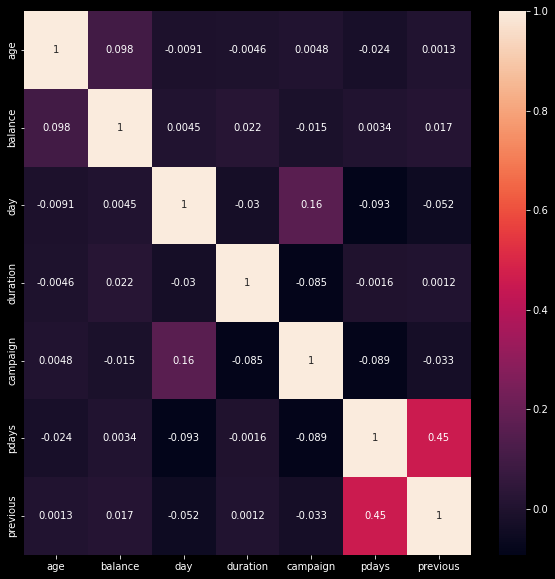

In [9]:
plt.figure(figsize=(10, 10))

sns.heatmap(df.corr(), annot=True);

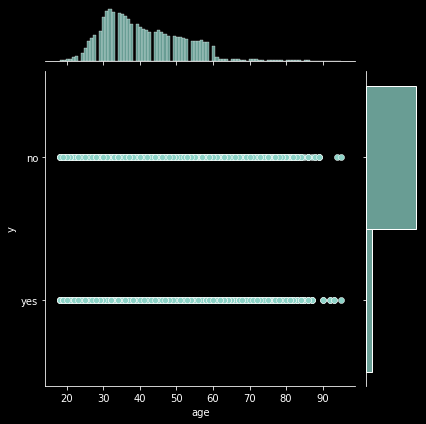

In [10]:
sns.jointplot(data=df, x=df["age"], y="y")
plt.show()

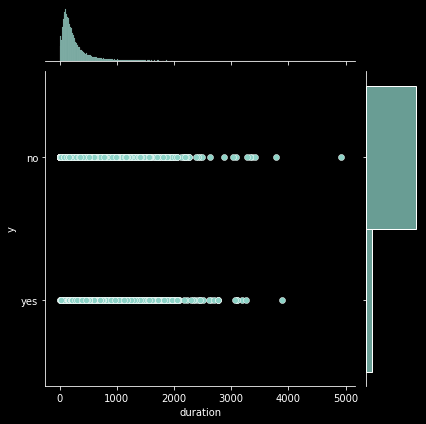

In [11]:
sns.jointplot(data=df, x=df["duration"], y="y")
plt.show()

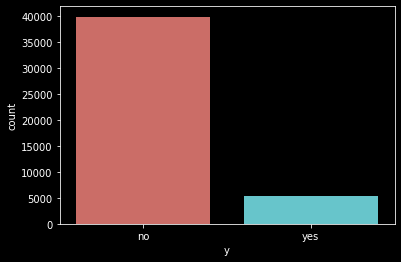

In [12]:
sns.countplot(x='y',data=df, palette='hls')
plt.show()

In [13]:
print(f"percentual não convertido:", len(df[df["y"]=="no"])/len(df[df["y"]!=0]))
print(f"percentual convertido:", len(df[df["y"]=="yes"])/len(df[df["y"]!=0]))

percentual não convertido: 0.8830151954170445
percentual convertido: 0.11698480458295547


In [14]:
df.groupby("job").mean()

,age,balance,day,duration,campaign,pdays,previous
job,,,,,,,
admin.,39.289886,1135.838909,15.564301,246.896732,2.575324,47.859021,0.671630
blue-collar,40.044081,1078.826654,15.442561,262.901562,2.816995,44.033498,0.505138
entrepreneur,42.190989,1521.470074,15.702085,256.309348,2.799597,32.486214,0.478144
housemaid,46.415323,1392.395161,16.002419,245.825000,2.820968,21.505645,0.371774
management,40.449567,1763.616832,16.114189,253.995771,2.864348,38.665468,0.668006
retired,61.626767,1984.215106,15.439488,287.361307,2.346731,37.443905,0.638693
self-employed,40.484484,1647.970868,16.027866,268.157061,2.853072,34.747308,0.551615
services,38.740250,997.088108,15.635532,259.318729,2.718344,41.995185,0.501204
student,26.542644,1388.060768,14.897655,246.656716,2.299574,57.041578,0.953092


In [15]:
df.groupby("marital").mean()

,age,balance,day,duration,campaign,pdays,previous
marital,,,,,,,
divorced,45.782984,1178.872287,15.796428,262.517188,2.630882,41.001728,0.551373
married,43.408099,1425.925590,15.854487,253.412765,2.842875,37.950467,0.556552
single,33.703440,1301.497654,15.708210,266.497967,2.649805,44.652385,0.642690


In [16]:
df.groupby("education").mean()

,age,balance,day,duration,campaign,pdays,previous
education,,,,,,,
primary,45.865567,1250.949934,15.421398,255.933002,2.834331,36.081740,0.489272
secondary,39.964270,1154.880786,15.759159,258.685760,2.700802,42.353504,0.567753
tertiary,39.593640,1758.416435,16.086535,258.518532,2.825577,39.024134,0.661980
unknown,44.510501,1526.754443,15.810985,257.313947,2.849219,36.856220,0.488422


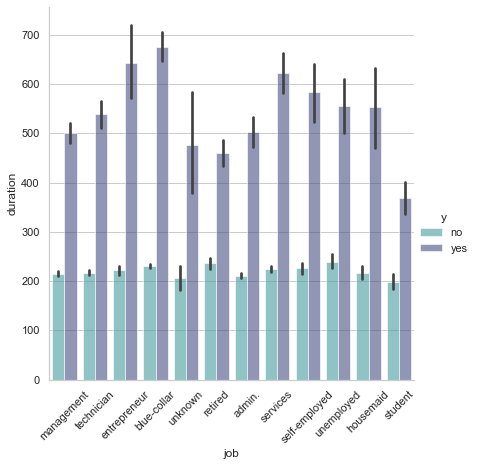

In [17]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="job", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

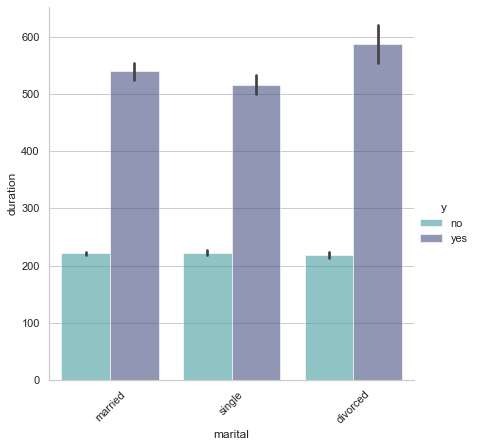

In [18]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="marital", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

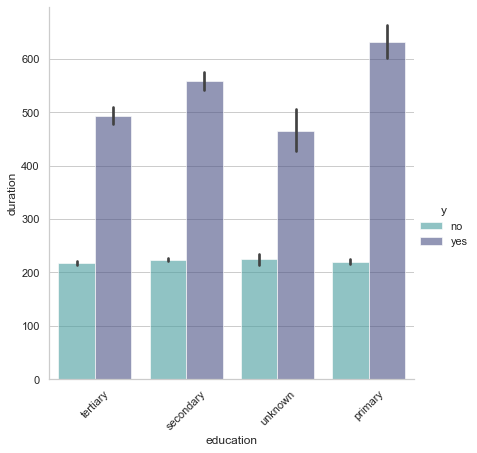

In [19]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="education", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

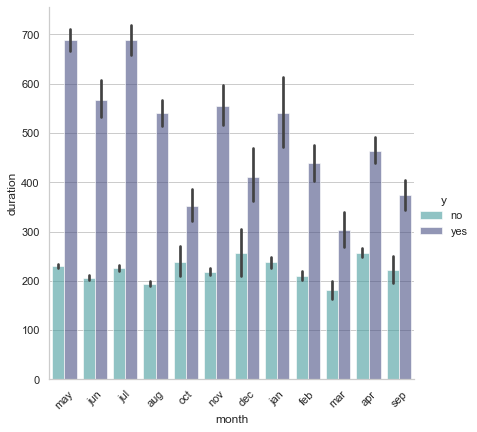

In [20]:
sns.set_theme(style="whitegrid")
sns.catplot(data=df, kind="bar", x="month", y="duration", hue="y", alpha=.6, height=6, palette="mako_r")
plt.xticks(rotation=45);

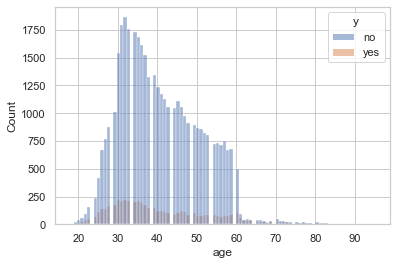

In [21]:
sns.histplot(data=df, x="age", hue="y");

In [22]:
features_cat = df.select_dtypes(exclude=np.number).columns.tolist()
features_cat

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'y']

In [23]:
features_num = df.select_dtypes(include=np.number).columns.tolist()
features_num

['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']

Construção da função pipeline para tratamento dos dados e divisão do dataser em dados de treino e teste

In [24]:
def pipe_pre_process(df=df, drop_not_features=["y"], 
                     col_target="y",
                     inputer_num_strategy="mean",
                     encoding="onehot"):
    '''
    - inputer_num_strategy (str): "mean", "median";
    - encoding (str): "onehot" para OneHotEncoder; "ordinal" OrdinalEncoder;
    '''
    
    label = LabelEncoder()
    
    X = df.drop(columns=drop_not_features)
    y_target = df[col_target]
    
    y = pd.DataFrame(y_target)
    
    y["y"] = label.fit_transform(y["y"])
          
    ax = sns.countplot(x=y["y"])
    
    print(f'Verificando as Target Balanceadas.{ax}')
 
    # ==========================================================
    features_num = X.select_dtypes(include=np.number).columns.to_list()

    pipe_features_num = imbpipeline([("input_num", SimpleImputer(strategy=inputer_num_strategy)),
                                  ("std", StandardScaler())])

    # ==========================================================
    
    features_cat = X.select_dtypes(exclude=np.number).columns.to_list()
    
    if encoding == "onehot":
    
        pipe_features_cat = imbpipeline([("input_cat", SimpleImputer(strategy="constant", fill_value="unknown")),
                                      ("onehot", OneHotEncoder(handle_unknown="ignore"))])
        
    elif encoding == "ordinal":
        
        pipe_features_cat = imbpipeline([("input_cat", SimpleImputer(strategy="constant", fill_value="unknown")),
                                         ("ordinal", OrdinalEncoder(handle_unknown="use_encoded_value",
                                                                 unknown_value=-1))])
    
    else:
        
        raise ValueError("Únicos encodings disponíveis são 'ordinal' e 'onehot'")
        
    # ==========================================================

    pre_processador = ColumnTransformer(transformers=[("transf_num", pipe_features_num, features_num),
                                                      ("transf_cat", pipe_features_cat, features_cat)])
    
    X = pre_processador.fit_transform(X)
    
    # ==========================================================
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
    
    smt = SMOTE()
    
    X_train, y_train = smt.fit_resample(X_train, y_train)
    
    return X_train, X_test, y_train, y_test

Verificando as Target Balanceadas.AxesSubplot(0.125,0.125;0.775x0.755)


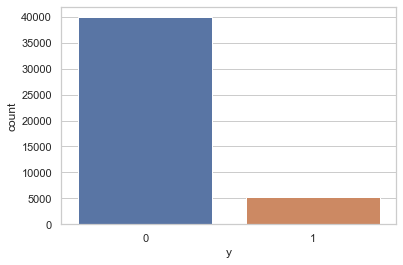

In [25]:
X_train, X_test, y_train, y_test = pipe_pre_process(df=df, drop_not_features=["y"], 
                                                           col_target="y",
                                                           inputer_num_strategy="median",
                                                           encoding="onehot")

Construção de funções para análise e avaliação do treinamento do algoritmo

In [26]:
def metricas_classificacao(estimator, X_train, X_test, y_train, y_test):
    
    # ============================================

    print("\nMétricas de avaliação de treino:")
    
    y_pred_train = estimator.predict(X_train)

    ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
    plt.show()

    print(classification_report(y_train, y_pred_train))

    # ============================================

    print("\nMétricas de avaliação de teste:")

    y_pred_test = estimator.predict(X_test)

    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
    plt.show()

    print(classification_report(y_test, y_pred_test))

    # ============================================

    f1_score_weighted = f1_score(y_test, y_pred_test, average='weighted')
    print(f"F1-score weighted: {100*f1_score_weighted:.2f}")
    return f1_score_weighted

In [27]:
def clf_metrics_com_return(modelo, X, y_true, label, plot_conf_mat=True, print_cr=True):
    
    if print_cr:
        print(f"\nMétricas de avaliação de {label}:\n")
    
    y_pred = modelo.predict(X)

    if plot_conf_mat:
        fig, ax = plt.subplots(1, 2, figsize=(12, 4))

        ConfusionMatrixDisplay.from_predictions(y_true, y_pred, ax=ax[0]) 
        ConfusionMatrixDisplay.from_predictions(y_true, y_pred, normalize="all", ax=ax[1])
        plt.show()

    if print_cr:
        print(classification_report(y_true, y_pred))
    
    return classification_report(y_true, y_pred, output_dict=True)

Treinamento dos Algoritimos Ligistic Regression, Random Forest, Decision Tree, SVC e Gradient Boosting

In [28]:
pipe_logit = LogisticRegression(random_state=42)

pipe_rf = RandomForestClassifier(random_state=42)

pipe_dt = DecisionTreeClassifier(random_state=42)

pipe_svm = SVC(random_state=42)

pipe_gb = GradientBoostingClassifier(n_estimators=20, random_state=42)

# =======================================

dict_pipes = {"logit" : pipe_logit,
              "random forest" : pipe_rf,
              "decision tree" : pipe_dt,
              "svm" : pipe_svm,
              "Gradiente" : pipe_gb}

# =======================================
# experimento!

resultado_experimentos = {"estimador" : [],
                          "f1_treino" : [],
                          "f1_teste" : []}

print_progress = False

for label, pipe in dict_pipes.items():
    
    if print_progress:
        print("\n")
        print("="*80)
        print(f"Estimador: {label}".center(80))
        print("(com hiperparâmetros default)".center(80))
        print("="*80)
        print("\n")

    # ================================
    
    pipe.fit(X_train, y_train)

    # ================================
    # Passo 2

    dict_metricas_treino = clf_metrics_com_return(pipe, X_train, y_train, "treino", plot_conf_mat=False, print_cr=False)
    
    if print_progress:
        print("#"*80)
        
    dict_metricas_teste = clf_metrics_com_return(pipe, X_test, y_test, "teste", plot_conf_mat=False, print_cr=False)
    
    # pegar as métricas pra salvar abaixo!
    f1_treino = dict_metricas_treino["weighted avg"]["f1-score"]
    f1_teste = dict_metricas_teste["weighted avg"]["f1-score"]
    
    # ================================
    # guardando os resultados do experimento
    
    resultado_experimentos["estimador"].append(label)
    resultado_experimentos["f1_treino"].append(f1_treino)
    resultado_experimentos["f1_teste"].append(f1_teste)
    
    
df_results = pd.DataFrame(resultado_experimentos)

df_results["gap"] = (df_results["f1_treino"] - df_results["f1_teste"]).apply(lambda x: x if x > 0 else np.inf)

df_results = df_results.sort_values("f1_teste", ascending=False).sort_values("gap")

df_results

,estimador,f1_treino,f1_teste,gap
4,Gradiente,0.851760,0.847554,0.004206
3,svm,0.918714,0.877316,0.041398
1,random forest,1.000000,0.901058,0.098942
2,decision tree,1.000000,0.875384,0.124616
0,logit,0.846460,0.865075,inf


Percebemos, após o treino, que os classificadores Random Forest e Decision Tree decoraram os dados apresentador, não sendo confiável seus resultados nos testes, pois, apesar de ter se saído bem no teste, sua capacidade de generalização não existe, não sendo classificadores confiáveis. Já o classificador Logistic Regression, apresentou underfiting, ou seja, não aprendeu, conforme o gap de confiança apresentado. 
Os demais classificadores apresentaram bons resultados, sendo o melhor deles o classificador o Gradiente Boosting devido ao menor gap de confiança apresentado.

## Treinamento do Perceptron

In [29]:
print(X_train.shape, y_test.shape)

(63874, 51) (9043, 1)


In [30]:
cv = RepeatedStratifiedKFold(n_splits = 2,
                             n_repeats = 4,
                             random_state = 42)

In [31]:
pcp = Perceptron()

scores = cross_val_score(pcp,
                         X_train,
                         y_train,
                         scoring = 'accuracy',
                         cv = cv,
                         n_jobs = -1)

In [32]:
print('Acurácia Média: %.3f' % (np.mean(scores)))
print('Desvio Padrão Médio: %.3f' % (np.std(scores)))

Acurácia Média: 0.787
Desvio Padrão Médio: 0.028


## Treinamento do PCA

Utilizando o PCA para selececionar as features de treinamento para o perceptron

In [33]:
print(X_train.shape, X_test.shape)

(63874, 51) (9043, 51)


In [34]:
pca = PCA(n_components=30) # feito teste com n_componentes 30 parametros foi onde teve pouca perda em relação a quantidade retirada de feature.

In [35]:
X_train_pca = pca.fit_transform(X_train)
X_teste_pca = pca.transform(X_test)

In [36]:
X_teste_pca.shape, X_teste_pca.shape

((9043, 30), (9043, 30))

In [37]:
X_teste_pca

array([[-6.23392613e-01, -4.27173075e-01, -2.12770591e-01, ...,
         1.51719531e-01, -4.18515697e-02, -4.50047393e-02],
       [-4.65027897e-01, -1.12676438e+00, -7.23291952e-02, ...,
         1.00432149e-01, -4.53925387e-04, -1.36506540e-02],
       [-5.54365183e-01, -1.01197166e+00, -1.00634027e+00, ...,
        -1.86287220e-01, -1.09253140e-01,  3.59748662e-04],
       ...,
       [-6.24399469e-01, -3.54161239e-01, -7.45071214e-01, ...,
         2.21875786e-01,  1.51729834e-02,  5.07963706e-03],
       [ 2.41837824e+00,  1.89948989e-01, -1.99734982e+00, ...,
         5.60311502e-01,  1.05644962e-01, -1.33432953e-01],
       [ 1.96300906e+00, -1.58101973e-01, -4.98343269e-01, ...,
         1.57074978e-01,  1.04271155e-01, -1.36082318e-01]])

In [38]:
pca.explained_variance_ratio_.sum()

0.978248169518879

## Treino com Perceptron após PCA

In [39]:
scores = cross_val_score(pcp,
                         X_train_pca,
                         y_train,
                         scoring = 'accuracy',
                         cv = cv,
                         n_jobs = -1)

In [40]:
print('Acurácia Média: %.3f' % (np.mean(scores)))
print('Desvio Padrão Médio: %.3f' % (np.std(scores)))

Acurácia Média: 0.733
Desvio Padrão Médio: 0.036


Verifica-se que o desempenho do perceptron após o PCA deu uma leve caída, entretanto, o custo computacional menor compensou a perda.

## Treino através de Rede Neural

Treinando a primeira rede neural com 3 camadas densas

In [41]:
rede_simples = Sequential()

In [42]:
rede_simples.add(Dense(8, 
            input_dim = X_train.shape[1]))
rede_simples.add(Activation('relu'))

rede_simples.add(Dense(16))
rede_simples.add(Activation('relu'))

rede_simples.add(Dense(4))
rede_simples.add(Activation('relu'))

rede_simples.add(Dense(y_train.shape[1]))
rede_simples.add(Activation('sigmoid'))

In [43]:
rede_simples.compile(loss = 'binary_crossentropy',
                     optimizer = "adam",
                     metrics=['accuracy'])

pesos_iniciais = rede_simples.get_weights()

rede_simples.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 8)                 416       
                                                                 
 activation (Activation)     (None, 8)                 0         
                                                                 
 dense_1 (Dense)             (None, 16)                144       
                                                                 
 activation_1 (Activation)   (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 4)                 68        
                                                                 
 activation_2 (Activation)   (None, 4)                 0         
                                                                 
 dense_3 (Dense)             (None, 1)                 5

In [44]:
early_stop = EarlyStopping(monitor = 'val_loss',
                           min_delta = 0.0010,
                          patience = 5,
                          verbose = 1,
                          mode = 'auto')

In [45]:
historico = rede_simples.fit(X_train,
                             y_train,
                             epochs = 100,
                             verbose = 1,
                             validation_data = (X_test, y_test),
                             callbacks = [early_stop])

Epoch 1/100
1997/1997 [==============================] - 2s 822us/step - loss: 0.3638 - accuracy: 0.8415 - val_loss: 0.3574 - val_accuracy: 0.8304
Epoch 2/100
1997/1997 [==============================] - 2s 757us/step - loss: 0.3119 - accuracy: 0.8706 - val_loss: 0.3517 - val_accuracy: 0.8343
Epoch 3/100
1997/1997 [==============================] - 2s 766us/step - loss: 0.3006 - accuracy: 0.8761 - val_loss: 0.3288 - val_accuracy: 0.8468
Epoch 4/100
1997/1997 [==============================] - 2s 754us/step - loss: 0.2932 - accuracy: 0.8796 - val_loss: 0.3410 - val_accuracy: 0.8385
Epoch 5/100
1997/1997 [==============================] - 2s 760us/step - loss: 0.2875 - accuracy: 0.8817 - val_loss: 0.3351 - val_accuracy: 0.8473
Epoch 6/100
1997/1997 [==============================] - 2s 777us/step - loss: 0.2825 - accuracy: 0.8848 - val_loss: 0.3203 - val_accuracy: 0.8531
Epoch 7/100
1997/1997 [==============================] - 2s 761us/step - loss: 0.2786 - accuracy: 0.8858 - val_loss: 0

In [46]:
y_pred = np.argmax(rede_simples.predict(X_test), axis = 1)
y_pred

283/283 [==============================] - 0s 504us/step


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [47]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94      7985
           1       0.00      0.00      0.00      1058

    accuracy                           0.88      9043
   macro avg       0.44      0.50      0.47      9043
weighted avg       0.78      0.88      0.83      9043



Matriz de confusão do modelo nos dados de teste:



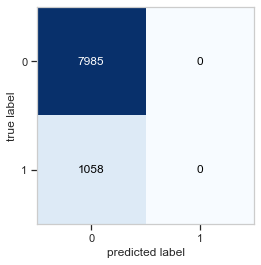

In [48]:
matriz = confusion_matrix(y_test, y_pred)

print("Matriz de confusão do modelo nos dados de teste:\n")
plot_confusion_matrix(conf_mat=matriz)
plt.show()

In [49]:
# loss e val_loss
loss = historico.history['loss']
val_loss = historico.history['val_loss']
epochs = range(len(loss))

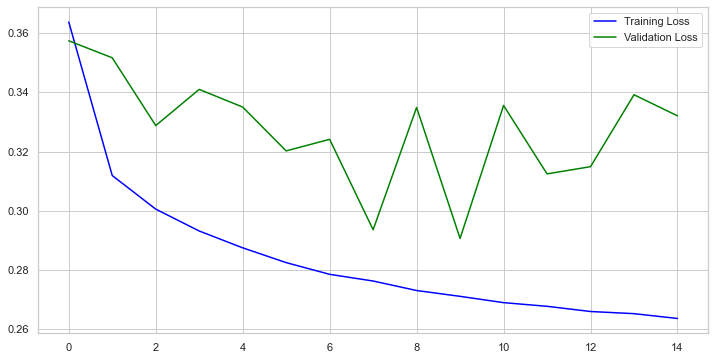

In [50]:
plt.figure(figsize = (12, 6))
plt.plot(epochs, loss, 'blue', label = 'Training Loss')
plt.plot(epochs, val_loss, 'green', label = 'Validation Loss')
plt.legend()
plt.show()

Treinamento de uma segunda rede neural com duas camadas densas para comaprativo de resultado

In [176]:
model = Sequential()


model.add(Dense(32, 
            input_dim = X_train.shape[1]))
model.add(Activation('relu'))
model.add(Dropout(0.2))

model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.2))

model.add(Dense(32))
model.add(Activation('relu'))

model.add(Dense(y_train.shape[1]))
model.add(Activation('sigmoid'))

In [177]:
early_stop = EarlyStopping(monitor = 'val_loss',
                           min_delta = 0.0010,
                          patience = 10,
                          verbose = 1,
                          mode = 'auto')

In [178]:
model.compile(loss = 'binary_crossentropy',
                     optimizer = "adam",
                     metrics=['accuracy'])

pesos_iniciais = model.get_weights()

model.summary()

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_90 (Dense)            (None, 32)                1664      
                                                                 
 activation_84 (Activation)  (None, 32)                0         
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 dense_91 (Dense)            (None, 64)                2112      
                                                                 
 activation_85 (Activation)  (None, 64)                0         
                                                                 
 dropout_3 (Dropout)         (None, 64)                0         
                                                                 
 dense_92 (Dense)            (None, 32)              

In [179]:
loss_earl = model.fit(X_train,
                      y_train,
                      epochs = 100,
                      verbose = 1,
                      validation_data = (X_test, y_test),
                      callbacks = [early_stop])

Epoch 1/100
1997/1997 [==============================] - 3s 1ms/step - loss: 0.3670 - accuracy: 0.8435 - val_loss: 0.3097 - val_accuracy: 0.8393
Epoch 2/100
1997/1997 [==============================] - 2s 1ms/step - loss: 0.3090 - accuracy: 0.8754 - val_loss: 0.3527 - val_accuracy: 0.8321
Epoch 3/100
1997/1997 [==============================] - 2s 1ms/step - loss: 0.2950 - accuracy: 0.8808 - val_loss: 0.3206 - val_accuracy: 0.8483
Epoch 4/100
1997/1997 [==============================] - 2s 1ms/step - loss: 0.2883 - accuracy: 0.8842 - val_loss: 0.3427 - val_accuracy: 0.8460
Epoch 5/100
1997/1997 [==============================] - 2s 1ms/step - loss: 0.2795 - accuracy: 0.8896 - val_loss: 0.3464 - val_accuracy: 0.8450
Epoch 6/100
1997/1997 [==============================] - 2s 1ms/step - loss: 0.2742 - accuracy: 0.8917 - val_loss: 0.3093 - val_accuracy: 0.8582
Epoch 7/100
1997/1997 [==============================] - 2s 1ms/step - loss: 0.2709 - accuracy: 0.8927 - val_loss: 0.2929 - val_ac

In [180]:
y_pred_2 = np.argmax(model.predict(X_test), axis = 1)
y_pred_2

283/283 [==============================] - 0s 611us/step


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [181]:
print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94      7985
           1       0.00      0.00      0.00      1058

    accuracy                           0.88      9043
   macro avg       0.44      0.50      0.47      9043
weighted avg       0.78      0.88      0.83      9043



Matriz de confusão do modelo nos dados de teste:



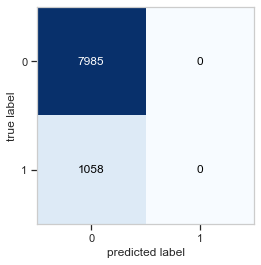

In [182]:
# Criação a matriz de confusão para o pred_labels e test_labels
matriz = confusion_matrix(y_test, y_pred_2)

print("Matriz de confusão do modelo nos dados de teste:\n")
plot_confusion_matrix(conf_mat=matriz)
plt.show()

In [183]:
# loss e val_loss
loss_2 = loss_earl.history['loss']
val_loss_2 = loss_earl.history['val_loss']
epochs = range(len(loss_2))

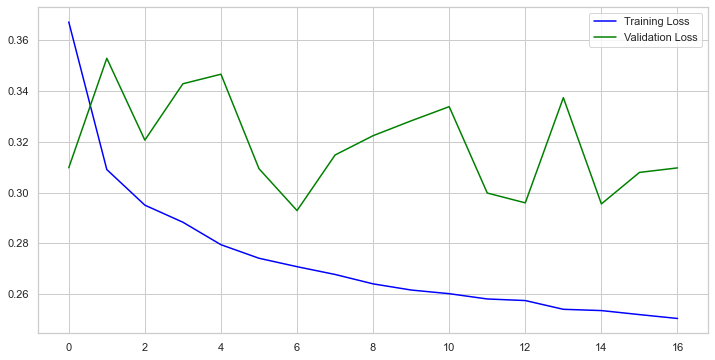

In [184]:
plt.figure(figsize = (12, 6))
plt.plot(epochs, loss_2, 'blue', label = 'Training Loss')
plt.plot(epochs, val_loss_2, 'green', label = 'Validation Loss')
plt.legend()
plt.show()

Após o treinamento das redes neurais, mesmo realizando os ajustes nas camadas e em numero de neurônios, verificamos que ocorreu o underfiting em ambas as redes. pois os dados não balanceados causa isto. 
Dessa forma, conclui-se que diante dos dados apresentados o classificador que melhor resultado, ou seja, realizou a predição com melhor acurácia foi o Gradiente Boosting.

* William de Oliveira
* Mariana Leite
* Antony Albert
* Rafael Rodrigues

## 